### **Task 2. Financial Impact of Reducing Prices**

In [160]:
# importing packages
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
import seaborn as sns
import pycountry
from datetime import datetime

sns.set(style="whitegrid")
custom_palette = ['#002a80', '#2c4fab', '#5974d6', '#889eec', '#bac9fe', '#ffe7c0', '#ffcf9f', '#ffb67e', '#ff9b5c', '#ff7d36']

#### Part 1. Build dataset with number of GeneXpert purchased (TGF)

Cleaning Transaction Summary Dataset:

In [74]:
# importing tgf transaction summary dataset - filtered for 'TB molecular diagnostics'
tgf_trans = pd.read_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/Input/TGF/transaction_summary.csv', encoding='utf-16', sep='\t')
# dropping first row
tgf_trans = tgf_trans.drop(index=0)

# transforming date columns into datetime format
date_columns = ['Purchase Order Date', 'Scheduled Delivery Date', 'Actual Delivery Date']

for col in date_columns:
    # issue with date columns - 'sept' to 'sep'
    tgf_trans[col] = tgf_trans[col].str.replace('Sept', 'Sep')
    tgf_trans[col] = pd.to_datetime(tgf_trans[col], format='%d-%b-%y')

# transforming columns to numerical
cols_to_num = ['Pack quantity', 'Product pack (USD)', 'Total Product Cost (USD)']

for col in cols_to_num:
    tgf_trans[col] = tgf_trans[col].str.replace(',', '').astype(float)
    tgf_trans[col] = pd.to_numeric(tgf_trans[col], errors='coerce')

# renaming columns
tgf_trans = tgf_trans.rename(columns={"Supplier/Agent/Manufacturer/Intermediatry  ": "Supplier/Agent/Manufacturer/Intermediatry",
                                      "Manufacturer  ": "Manufacturer", 
                                      "Description ": "Description",
                                      "Freight Cost ": "Freight Cost"})

# excluding regional/multicountry observations - e.g. 'Africa', 'Americas', etc.
valid_codes = [country.alpha_3 for country in pycountry.countries]
tgf_trans['Country Code'] = tgf_trans['Grant Name'].str[:3]
tgf_trans = tgf_trans[tgf_trans['Country Code'].isin(valid_codes)]

Retaining GeneXpert and calculating total purchases:

In [75]:
# keep only Cepheid products
tgf_ceph = tgf_trans[(tgf_trans['Manufacturer']=='Cepheid') & tgf_trans['Description'].str.startswith('Cepheid')]

# creating column for number of tests in each product pack
tgf_ceph['N Units in Pack'] = tgf_ceph['Product Pack'].str.extract('(\d+)').astype(int)

# total number of tests per order
tgf_ceph['N Units Total'] = tgf_ceph['N Units in Pack'] * tgf_ceph['Pack quantity']

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_65451/669135012.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tgf_ceph['N Units in Pack'] = tgf_ceph['Product Pack'].str.extract('(\d+)').astype(int)
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_65451/669135012.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tgf_ceph['N Units Total'] = tgf_ceph['N Units in Pack'] * tgf_ceph['Pack quantity']


In [76]:
tgf_ceph.head()

,Country/Teritorry,Grant Name,Supplier/Agent/Manufacturer/Intermediatry,Manufacturer,Product Category,Product,Description,Product Pack,Purchase Order Date,Scheduled Delivery Date,...,Purchase Order Number,Invoice Currency Name,Primary Key,Status,Pack quantity,Product pack (USD),Total Product Cost (USD),Country Code,N Units in Pack,N Units Total
1,Afghanistan,AFG-T-UNDP,Direct from Mfg,Cepheid,"Diagnostic, PPE and Medical Device",TB molecular diagnostics,Cepheid GeneXpert Model GX-IV- 4 module Instru...,1 unit / test,2015-07-29,2015-10-15,...,AFG10-GP404135-1,United States Dollar,61987,Admin-Publish,4.0,17500.0,70000.0,AFG,1,4.0
2,Afghanistan,AFG-T-UNDP,Direct from Mfg,Cepheid,"Diagnostic, PPE and Medical Device",TB molecular diagnostics,Cepheid GeneXpert Model GX-IV- 4 module Instru...,1 unit / test,2017-10-05,2017-12-19,...,AFG10-GP406031-1,United States Dollar,73391,Admin-Publish,11.0,17500.0,192500.0,AFG,1,11.0
3,Afghanistan,AFG-T-UNDP,Direct from Mfg,Cepheid,"Diagnostic, PPE and Medical Device",TB molecular diagnostics,"Cepheid Xpert MTB/RIF kit (10s, 50s) [CGXMTBRIF]",50 tests,2015-07-29,2015-10-15,...,AFG10-GP404135-1,United States Dollar,61988,Admin-Publish,24.0,499.0,11976.0,AFG,50,1200.0
4,Afghanistan,AFG-T-UNDP,Direct from Mfg,Cepheid,"Diagnostic, PPE and Medical Device",TB molecular diagnostics,"Cepheid Xpert MTB/RIF kit (10s, 50s) [CGXMTBRIF]",50 tests,2015-07-29,2016-03-01,...,GP404135-1,United States Dollar,66556,Admin-Publish,95.0,499.0,47405.0,AFG,50,4750.0
5,Afghanistan,AFG-T-UNDP,Direct from Mfg,Cepheid,"Diagnostic, PPE and Medical Device",TB molecular diagnostics,"Cepheid Xpert MTB/RIF kit (10s, 50s) [CGXMTBRIF]",50 tests,2017-10-05,2017-12-19,...,AFG10-GP406031-1,United States Dollar,73392,Published,110.0,499.0,54890.0,AFG,50,5500.0


In [77]:
tgf_ceph['Description'].value_counts()

Description
Cepheid Xpert MTB/RIF kit (10s, 50s) [CGXMTBRIF]                                              460
Cepheid Xpert MTB/RIF Ultra (50s) [GXMTB/RIF-ULTRA-50]                                        338
Cepheid GeneXpert Model GX-IV- 4 module Instrument with laptop [GXIV-4-L]                     100
Cepheid GeneXpert Model GX-IV- 4 module Instrument with desktop [GXIV-4D]                      86
Cepheid Xpert MTB/XDR kit (10s) [GXMTB/XDR-10]                                                 82
Cepheid GeneXpert Model GX-XVI-16 module instrument with desktop[GXXVI-16-D]                   19
Cepheid GeneXpert Model GX-IV R2 2-module (10-color) Instrument with laptop [GXIV-2-L-10C]     13
Cepheid GeneXpert IV system with desktop computer (two sites) [GXIV-2-D]                       11
Cepheid GeneXpert IV system with laptop computer (two sites) [GXIV-2-L]                        11
Cepheid GeneXpert Model GX-XVI-16 module instrument with laptop [GXXVI-16-L]                    7
Cepheid 

In [78]:
# change product names
prod_dict = {"Cepheid Xpert MTB/XDR kit (10s) [GXMTB/XDR-10]": "Cepheid Xpert MTB/XDR",
   "Cepheid Xpert MTB/RIF kit (10s, 50s) [CGXMTBRIF]": "Cepheid Xpert MTB/RIF",
   "Cepheid Xpert MTB/RIF Ultra (50s) [GXMTB/RIF-ULTRA-50]": "Cepheid Xpert MTB/RIF Ultra",
   "Cepheid Xpert MTB/RIF Ultra (10s) [GXMTB/RIF-ULTRA-10]": "Cepheid Xpert MTB/RIF Ultra"}

tgf_ceph['Description'] = tgf_ceph['Description'].map(prod_dict).fillna(tgf_ceph['Description'])

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_65451/3033065700.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tgf_ceph['Description'] = tgf_ceph['Description'].map(prod_dict).fillna(tgf_ceph['Description'])


Include fixed prices to account for Xpert price drop:

In [79]:
date1 = datetime.strptime('06-08-2012', '%d-%m-%Y')
date2 = datetime.strptime('19-09-2023', '%d-%m-%Y')

for index, row in tgf_ceph.iterrows():
    if row['Description'] in ['Cepheid Xpert MTB/RIF', 'Cepheid Xpert MTB/RIF Ultra']:
        if row['Purchase Order Date'] <= date1:
            tgf_ceph.loc[index, 'Unit Price'] = 16.86
        elif row['Purchase Order Date'] <= date2:
            tgf_ceph.loc[index, 'Unit Price'] = 9.98
        else:
            tgf_ceph.loc[index, 'Unit Price'] = 7.97
    elif row['Description'] == 'Cepheid Xpert MTB/XDR':
        if row['Purchase Order Date'] > date2:
            tgf_ceph.loc[index, 'Unit Price'] = 14.9
        else:
            tgf_ceph.loc[index, 'Unit Price'] = 19.8
    else:
        tgf_ceph.loc[index, 'Unit Price'] = row['Total Product Cost (USD)'] / row['N Units Total']

/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_65451/422304353.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tgf_ceph.loc[index, 'Unit Price'] = row['Total Product Cost (USD)'] / row['N Units Total']


Grouping by country, year and product for final dataset:

In [80]:
tgf_final = tgf_ceph.groupby(['Country/Teritorry', 
                              tgf_ceph['Purchase Order Date'].dt.year, 
                              'Description', 'Unit Price'])['N Units Total'].sum().reset_index()

In [81]:
tgf_final

,Country/Teritorry,Purchase Order Date,Description,Unit Price,N Units Total
0,Afghanistan,2015,Cepheid GeneXpert Model GX-IV- 4 module Instru...,17500.00,4.0
1,Afghanistan,2015,Cepheid Xpert MTB/RIF,9.98,5950.0
2,Afghanistan,2017,Cepheid GeneXpert Model GX-IV- 4 module Instru...,17500.00,11.0
3,Afghanistan,2017,Cepheid Xpert MTB/RIF,9.98,5500.0
4,Afghanistan,2018,Cepheid Xpert MTB/RIF,9.98,10000.0
...,...,...,...,...,...
713,Zimbabwe,2020,Cepheid Xpert MTB/RIF Ultra,9.98,229800.0
714,Zimbabwe,2021,Cepheid Xpert MTB/RIF Ultra,9.98,89400.0
715,Zimbabwe,2022,Cepheid Xpert MTB/RIF Ultra,9.98,109650.0
716,Zimbabwe,2023,Cepheid Xpert MTB/RIF Ultra,9.98,136850.0


Saving final dataset to 'Data' folder:

In [82]:
tgf_final.to_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/tgf_purchases.csv')

#### Part 2. Build dataset with countries' TB funding by source and total requirements (WHO)

In [83]:
# reading in WHOs bduget dataset
fund = pd.read_csv("/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/Input/WHO/TB_budget_2024-12-05.csv")

Selecting necessary variables:
- Expected funding from domestic sources, including loans (US Dollars): `cf_tot_domestic`
- Expected funding from USAID (US Dollars): `cf_tot_usaid`
- Expected funding from the Global Fund to Fight AIDS, Tuberculosis and Malaria (US Dollars): `cf_tot_gf`
- Expected funding from other sources (US Dollars): `cf_tot_grnt`
- Expected funding for laboratory infrastructure, equipment and supplies (US Dollars): `cf_lab`
- Total expected funding from all sources (US Dollars): `cf_tot_sources`
- Budget required for laboratory infrastructure, equipment and supplies (US Dollars): `budget_lab`
- Total budget required (US Dollars): `budget_tot`

In [84]:
fund_vars = ['country', 'year', 'cf_tot_domestic', 'cf_tot_usaid', 'cf_tot_gf', 'cf_lab', 'cf_tot_grnt', 
             'cf_tot_sources', 'budget_lab', 'budget_tot']

fund = fund[fund_vars]

# removing rows without funding data
rows_to_drop = fund[fund[fund.columns[2:]].isna().all(axis=1)]
fund = fund[~fund.index.isin(rows_to_drop.index)]

Creating 'Funding Gap' variable:

In [85]:
fund['budget_gap'] = fund['budget_tot']-fund['cf_tot_sources']

In [86]:
fund

,country,year,cf_tot_domestic,cf_tot_usaid,cf_tot_gf,cf_lab,cf_tot_grnt,cf_tot_sources,budget_lab,budget_tot,budget_gap
0,Afghanistan,2018,533779.0,4462530.0,3178499.0,2473391.0,2523675.0,10698483.0,2543262.0,10881354.0,182871.0
1,Afghanistan,2019,511854.0,2766449.0,6533095.0,2208668.0,3608394.0,13419792.0,2797414.0,16957452.0,3537660.0
2,Afghanistan,2020,1171864.0,3000000.0,6935551.0,3188713.0,6871009.0,17978424.0,3200000.0,19137128.0,1158704.0
3,Afghanistan,2021,NaN,NaN,7638546.0,1696418.0,2995053.0,10633599.0,1696418.0,10633599.0,0.0
4,Afghanistan,2022,269339.0,1555946.0,6876137.0,715071.0,1898528.0,10599950.0,515246.0,14141821.0,3541871.0
...,...,...,...,...,...,...,...,...,...,...,...
1500,Zimbabwe,2020,247705.0,1870556.0,8300758.0,2541507.0,337233.0,10756252.0,3058011.0,31504677.0,20748425.0
1501,Zimbabwe,2021,2096683.0,3284585.0,9803368.0,2401506.0,911965.0,16096601.0,6529001.0,32126351.0,16029750.0
1502,Zimbabwe,2022,1000000.0,3058830.0,9487457.0,1800050.0,1301355.0,14847642.0,3557975.0,22656137.0,7808495.0
1503,Zimbabwe,2023,1000000.0,9378910.0,5774773.0,3644102.0,NaN,16153683.0,4840102.0,17359487.0,1205804.0


Saving final dataset to 'Data' folder:

In [87]:
fund.to_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/funding_who.csv')

#### Part 3. Calculate Savings from Price Drop

In [88]:
# clean columns
savings = tgf_final.rename(
    columns={'Country/Teritorry': 'Country',
        'Purchase Order Date': 'Year'})

For every year, I will simulate a price drop of Ultra tests to 5$ and of XDR tests to $10. 

Then I will calculate savings by computing: $\text{Qt. Ordered}*∆\text{Price}$

In [89]:
# simulate price drop to $5 for ultra tests
    # 7.97 -> 5
    # 9.98 -> 5
# simulate price drop to $10 for xdr tests

savings['Lower Price'] = savings['Unit Price'].apply(
    lambda x: 5 if x in [9.98, 7.97] else (10 if x in [14.9, 19.8] else x))

# savings per entry
savings['Savings'] = savings['N Units Total']*(savings['Unit Price']-savings['Lower Price'])

Now calculate:
- Total TGF Savings 2023 and 2024 (until May)
- 2023 TGF Savings Breakdown by coutry - in absolute and % of budget gap

In [90]:
print(f"Total TGF Savings 2023: {round(savings[savings['Year']==2023]['Savings'].sum(),0)}$")
print(f"Total TGF Savings 2024 (until May): {round(savings[savings['Year']==2024]['Savings'].sum(),0)}$")

Total TGF Savings 2023: 15553914.0$
Total TGF Savings 2024 (until May): 2176222.0$


In [189]:
# country breakdown
# only 35 countries ordered in 2023
country_break = pd.DataFrame(savings[savings['Year']==2023].groupby("Country", as_index=False)["Savings"].sum())
country_break['Savings'] = country_break['Savings'].round(0)

country_break.head()

,Country,Savings
0,Angola,153882.0
1,Armenia,16026.0
2,Azerbaijan,136800.0
3,Bangladesh,1543800.0
4,Belarus,177786.0


In [190]:
# merge with funding dataset for comparisons
country_break = pd.merge(country_break, fund[fund['year']==2023],
    left_on=['Country'],
    right_on=['country'],
    how='left').drop(columns=['country', 'year'])

In [191]:
country_break['Perc. TGF Fund'] = round(100*country_break['Savings']/country_break['cf_tot_gf'],3)

country_break['Perc. Total Fund'] = round(100*country_break['Savings']/country_break['budget_tot'],3)

country_break['Perc. Gap'] = country_break.apply(
    lambda row: 'No Gap' if row['budget_gap'] <= 0 else round(100*row['Savings'] / row['budget_gap'],3),
    axis=1)

country_break['Perc. Diagnosis Gap'] = country_break.apply(
    lambda row: 'No Gap' if (row['budget_lab'] - row['cf_lab']) <= 0 else round(100*row['Savings'] / (row['budget_lab'] - row['cf_lab']),3),
    axis=1)

In [192]:
# clean
country_break = country_break[['Country', 'Savings', 'Perc. TGF Fund', 'Perc. Total Fund', 'Perc. Gap', 'Perc. Diagnosis Gap']]

In [193]:
country_break

,Country,Savings,Perc. TGF Fund,Perc. Total Fund,Perc. Gap,Perc. Diagnosis Gap
0,Angola,153882.0,5.410,0.755,1.597,41.743
1,Armenia,16026.0,NaN,2.165,NaN,NaN
2,Azerbaijan,136800.0,6.435,0.778,No Gap,No Gap
3,Bangladesh,1543800.0,2.663,0.756,3.181,4.588
4,Belarus,177786.0,NaN,NaN,NaN,NaN
5,Bhutan,17000.0,2.558,1.028,1.953,25.08
6,Burkina Faso,166867.0,4.513,4.486,No Gap,No Gap
7,Cambodia,747000.0,10.671,2.117,4.538,25.759
8,Central African Republic,0.0,0.000,0.000,0.0,0.0
9,Congo,75717.0,6.615,1.768,No Gap,No Gap


In [194]:
country_break.to_csv('../Data/savings_breakdown_2023.csv')

Instead of yearly savings, I will calculate savings per funding round:

In [175]:
tgf_23_25 = 2410016550
# for TB screening and diagnosis
tgf_23_25_diag = 419747669

tgf_20_22 = 2242767741
# for TB case detection and diagnosis
tgf_20_22_diag = 484267427

In [217]:
xpert = savings[(savings['Year'].isin([2023, 2024]))&(savings['Description'].isin(['Cepheid Xpert MTB/RIF', 'Cepheid Xpert MTB/RIF Ultra', 'Cepheid Xpert MTB/XDR']))]
xpert['Cost'] = xpert['Unit Price']*xpert['N Units Total']

print(f"% TGF Funds spent on Xpert 2023-2025: {100*xpert['Cost'].sum()/tgf_23_25}")

xpert = savings[(savings['Year'].isin([2020, 2021, 2022]))&(savings['Description'].isin(['Cepheid Xpert MTB/RIF', 'Cepheid Xpert MTB/RIF Ultra', 'Cepheid Xpert MTB/XDR']))]
xpert['Cost'] = xpert['Unit Price']*xpert['N Units Total']

print(f"% TGF Funds spent on Xpert 2023-2025: {100*xpert['Cost'].sum()/tgf_20_22}")

% TGF Funds spent on Xpert 2023-2025: 1.55875261520507
% TGF Funds spent on Xpert 2023-2025: 4.802822262459142


/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_65451/1534233245.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xpert['Cost'] = xpert['Unit Price']*xpert['N Units Total']
/var/folders/4h/c_6klx0d0bd723smcqr1l_3h0000gn/T/ipykernel_65451/1534233245.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  xpert['Cost'] = xpert['Unit Price']*xpert['N Units Total']


In [185]:
print(f"Total TGF Savings 2023-2025 Round: {round(savings[savings['Year'].isin([2023, 2024])]['Savings'].sum(),0)}$")
print(f"Diagnosis Funding as % of Funding 2023-2025 Round: {round(100*tgf_23_25_diag/tgf_23_25,2)}%")
print(f"Total TGF Savings as % of Funding 2023-2025 Round: {round(100*savings[savings['Year'].isin([2023, 2024])]['Savings'].sum()/tgf_23_25,2)}%")
print("\n")
print(f"Total TGF Savings 2020-2022 Round: {round(savings[savings['Year'].isin([2020, 2021, 2022])]['Savings'].sum(),0)}$")
print(f"Diagnosis Funding as % of Funding 2020-2022 Round: {round(100*tgf_20_22_diag/tgf_20_22,2)}%")
print(f"Total TGF Savings as % of Funding 2020-2022 Round: {round(100*savings[savings['Year'].isin([2020, 2021, 2022])]['Savings'].sum()/tgf_20_22,2)}%")

Total TGF Savings 2023-2025 Round: 17730136.0$
Diagnosis Funding as % of Funding 2023-2025 Round: 17.42%
Total TGF Savings as % of Funding 2023-2025 Round: 0.74%


Total TGF Savings 2020-2022 Round: 53743838.0$
Diagnosis Funding as % of Funding 2020-2022 Round: 21.59%
Total TGF Savings as % of Funding 2020-2022 Round: 2.4%


In [ ]:
fund

In [210]:
# country savings breakdown 2023-2025

country_break = pd.DataFrame(savings[savings['Year'].isin([2023, 2024])].groupby(["Country"], as_index=False)["Savings"].sum())
country_break['Savings'] = country_break['Savings'].round(0)

country_break = pd.merge(country_break, 
                         pd.DataFrame(fund[fund['year'].isin([2023, 2024])].groupby(["country"], as_index=False)[['cf_tot_gf', 'cf_lab', 'budget_tot', 'budget_lab', 'budget_gap']].sum()),
    left_on=['Country'],
    right_on=['country'],
    how='left').drop(columns=['country'])

country_break['Perc. TGF Fund'] = round(100*country_break['Savings']/country_break['cf_tot_gf'],3)

country_break['Perc. Total Fund'] = round(100*country_break['Savings']/country_break['budget_tot'],3)

country_break['Perc. Gap'] = country_break.apply(
    lambda row: 'No Gap' if row['budget_gap'] <= 0 else round(100*row['Savings'] / row['budget_gap'],3),
    axis=1)

country_break['Perc. Diagnosis Gap'] = country_break.apply(
    lambda row: 'No Gap' if (row['budget_lab'] - row['cf_lab']) <= 0 else round(100*row['Savings'] / (row['budget_lab'] - row['cf_lab']),3),
    axis=1)

country_break = country_break[['Country', 'Savings', 'Perc. TGF Fund', 'Perc. Total Fund', 'Perc. Gap', 'Perc. Diagnosis Gap']]

country_break.to_csv('../Data/savings_breakdown_2023-25.csv')

In [204]:
# country savings breakdown 2020-2022

country_break = pd.DataFrame(savings[savings['Year'].isin([2020, 2021, 2022])].groupby(["Country"], as_index=False)["Savings"].sum())
country_break['Savings'] = country_break['Savings'].round(0)

country_break = pd.merge(country_break, 
                         pd.DataFrame(fund[fund['year'].isin([2020, 2021, 2022])].groupby(["country"], as_index=False)[['cf_tot_gf', 'cf_lab', 'budget_tot', 'budget_lab', 'budget_gap']].sum()),
    left_on=['Country'],
    right_on=['country'],
    how='left').drop(columns=['country'])

country_break['Perc. TGF Fund'] = round(100*country_break['Savings']/country_break['cf_tot_gf'],3)

country_break['Perc. Total Fund'] = round(100*country_break['Savings']/country_break['budget_tot'],3)

country_break['Perc. Gap'] = country_break.apply(
    lambda row: 'No Gap' if row['budget_gap'] <= 0 else round(100*row['Savings'] / row['budget_gap'],3),
    axis=1)

country_break['Perc. Diagnosis Gap'] = country_break.apply(
    lambda row: 'No Gap' if (row['budget_lab'] - row['cf_lab']) <= 0 else round(100*row['Savings'] / (row['budget_lab'] - row['cf_lab']),3),
    axis=1)

country_break = country_break[['Country', 'Savings', 'Perc. TGF Fund', 'Perc. Total Fund', 'Perc. Gap', 'Perc. Diagnosis Gap']]

country_break.to_csv('../Data/savings_breakdown_2020-22.csv')

#### Part 4. Build PPP dataset (World Bank)

Country-level data since 2012. 

In [ ]:
# exchange rates and ppp conversion factors
exchang_ppp = pd.read_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/Input/WB/WB_exchange_PPP.csv')

In [98]:
# cleaning 
# dropping cols
exchang_ppp = exchang_ppp.drop(columns='Series Code')
# renaming cols
exchang_ppp.columns = [col[:4] if col[:4].isdigit() else col for col in exchang_ppp.columns]
# dropping non-country rows
last_index = exchang_ppp[exchang_ppp['Country Name'] == 'Zimbabwe'].index[-1]
exchang_ppp = exchang_ppp.iloc[:last_index+1]

In [99]:
# pivoting to have years as rows and series as columns
exchang_ppp = exchang_ppp.melt(id_vars=['Country Name', 'Country Code', 'Series Name'], 
                               var_name='Year', value_name='Measure')

exchang_ppp = exchang_ppp.pivot(index=["Country Name", "Country Code", "Year"], 
                      columns="Series Name", 
                      values="Measure")

exchang_ppp.reset_index(inplace=True)

Desired Price Metric: $\frac{\text{Test Price x Exchange Rate}}{\text{Test Price x PPP Conversion Factor}}$

In [100]:
exchang_ppp['Price level ratio of PPP conversion factor (GDP) to market exchange rate'] = exchang_ppp['Price level ratio of PPP conversion factor (GDP) to market exchange rate'].apply(pd.to_numeric, errors='coerce')
exchang_ppp['Price Measure'] = 1/exchang_ppp['Price level ratio of PPP conversion factor (GDP) to market exchange rate']

In [101]:
exchang_ppp

Series Name,Country Name,Country Code,Year,"Official exchange rate (LCU per US$, period average)","PPP conversion factor, GDP (LCU per international $)",Price level ratio of PPP conversion factor (GDP) to market exchange rate,Price Measure
0,Afghanistan,AFG,2012,50.9214,16.9302950898685,0.327604,3.052467
1,Afghanistan,AFG,2013,55.3775,16.8815458389923,0.298647,3.348430
2,Afghanistan,AFG,2014,57.2475,16.1278038080551,0.280988,3.558872
3,Afghanistan,AFG,2015,61.1434615416667,15.8235824504332,0.247614,4.038540
4,Afghanistan,AFG,2016,67.8660857692308,15.9236559656703,0.235897,4.239144
...,...,...,...,...,...,...,...
2599,Zimbabwe,ZWE,2019,..,5.09612328128815,0.524379,1.907018
2600,Zimbabwe,ZWE,2020,51.3290131226287,31.5961934064567,0.492912,2.028760
2601,Zimbabwe,ZWE,2021,88.5524472597436,60.8777489512443,0.541445,1.846908
2602,Zimbabwe,ZWE,2022,374.954362604663,207.348972223936,0.458043,2.183199


#### Part 5. Regress Price on Outcome Measures

Country-Year Outcome Measures:
- Step 1 - Diagnosis Rate ($\frac{\text{Number of Cases Diagnosed}}{\text{Incidence Estimates}}$)
- Step 2 - Treatment Outcome

In [102]:
# Estimates
estimates = pd.read_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/Input/WHO/TB_burden_countries_2024-12-17.csv')
# c_cdr: Case detection rate (all forms) [also known as TB treatment coverage], percent
# cfr Estimated TB case fatality ratio
# e_mort_100k Estimated mortality of TB cases (all forms) per 100 000 population
estimates = estimates[['country', 'year', 'c_cdr', 'cfr', 'e_mort_100k']]

# Outcomes
outcomes = pd.read_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/Input/WHO/TB_outcomes_2024-12-17.csv')
#c_new_tsr Treatment success rate for all new cases (including relapse cases if rel_with_new_flg = 1), percent
outcomes = outcomes[['country', 'year', 'c_new_tsr']]

In [103]:
# merge datasets into one single outcome measure storage
# outer merge to keep everything
outcome_measures = pd.merge(estimates, outcomes, on=['country', 'year'], how='outer')

Merge pricing and outcome measure data:

In [120]:
# left merge to exclude observations without price info
exchang_ppp['Year'] = pd.to_numeric(exchang_ppp['Year'], errors='coerce', downcast='integer')
outcome_measures['year'] = pd.to_numeric(outcome_measures['year'], errors='coerce', downcast='integer')

price_regs = pd.merge(exchang_ppp, outcome_measures, left_on=['Country Name', 'Year'], 
                      right_on=['country', 'year'], how='left')

# drop unnecessary columns 
price_regs = price_regs[['Country Name', 'Year', 'Price Measure', 'c_cdr', 'cfr', 
                        'e_mort_100k', 'c_new_tsr']]

In [121]:
price_regs

,Country Name,Year,Price Measure,c_cdr,cfr,e_mort_100k,c_new_tsr
0,Afghanistan,2012,3.052467,50.0,0.25,45.0,88.0
1,Afghanistan,2013,3.348430,51.0,0.24,44.0,88.0
2,Afghanistan,2014,3.558872,51.0,0.24,43.0,87.0
3,Afghanistan,2015,4.038540,56.0,0.22,40.0,88.0
4,Afghanistan,2016,4.239144,64.0,0.19,34.0,93.0
...,...,...,...,...,...,...,...
2599,Zimbabwe,2019,1.907018,69.0,0.22,43.0,84.0
2600,Zimbabwe,2020,2.028760,54.0,0.24,44.0,88.0
2601,Zimbabwe,2021,1.846908,52.0,0.25,49.0,90.0
2602,Zimbabwe,2022,2.183199,54.0,0.26,52.0,89.0


Scatter Plots:

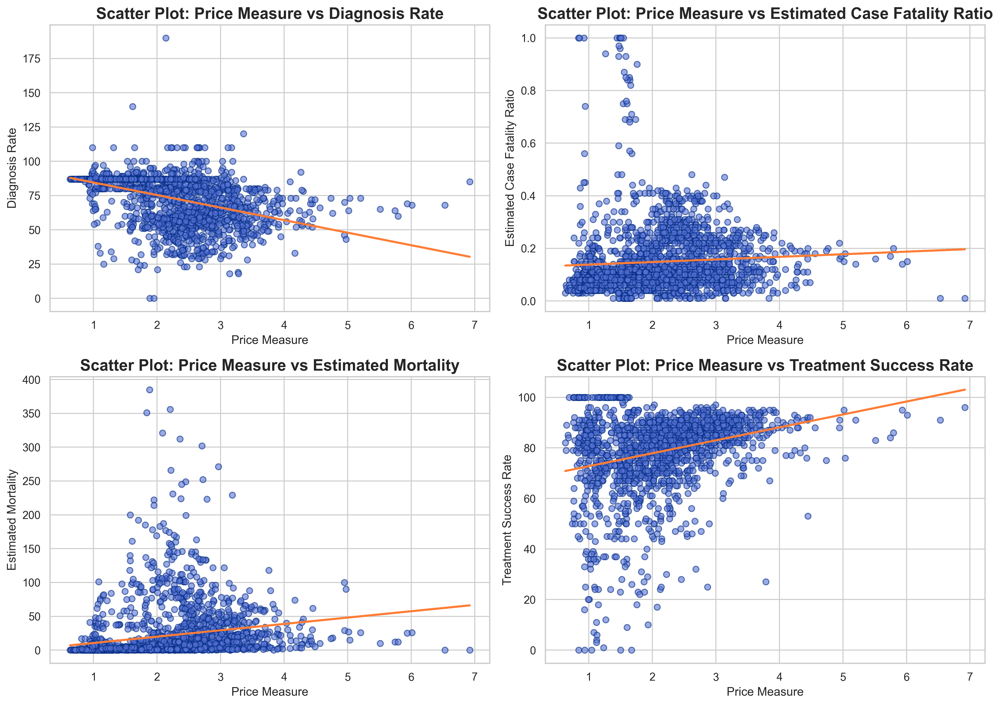

In [112]:
# list of variables to plot against 'Price Measure'
y_vars = ['c_cdr', 'cfr', 'e_mort_100k', 'c_new_tsr']
meanings = ['Diagnosis Rate', 'Estimated Case Fatality Ratio', 'Estimated Mortality', 'Treatment Success Rate']

# color palette
dot_color = '#5974d6'
line_color = '#ff7d36' #orange

# create subplots with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(14, 10), dpi=300)

axes = axes.flatten()

# loop through the variables and create scatter plots with regression line
for i, y_var in enumerate(y_vars):
    # remove rows with NaN values for the current variable
    valid_data = price_regs[['Price Measure', y_var]].dropna()

    # Scatter plot with border color
    axes[i].scatter(valid_data['Price Measure'], valid_data[y_var], color=dot_color, alpha=0.6, edgecolors='#002a80')
        
    # fit linear regression
    # (degree 1 is linear)
    slope, intercept = np.polyfit(valid_data['Price Measure'], valid_data[y_var], 1)
    regression_line = slope * valid_data['Price Measure'] + intercept
    # plot regression line
    axes[i].plot(valid_data['Price Measure'], regression_line, color=line_color, linewidth=2, label='Regression Line')
    
    axes[i].set_title(f'Scatter Plot: Price Measure vs {meanings[i]}', fontsize=16, fontweight='bold')
    axes[i].set_xlabel('Price Measure')
    axes[i].set_ylabel(meanings[i])

plt.tight_layout()
plt.show()


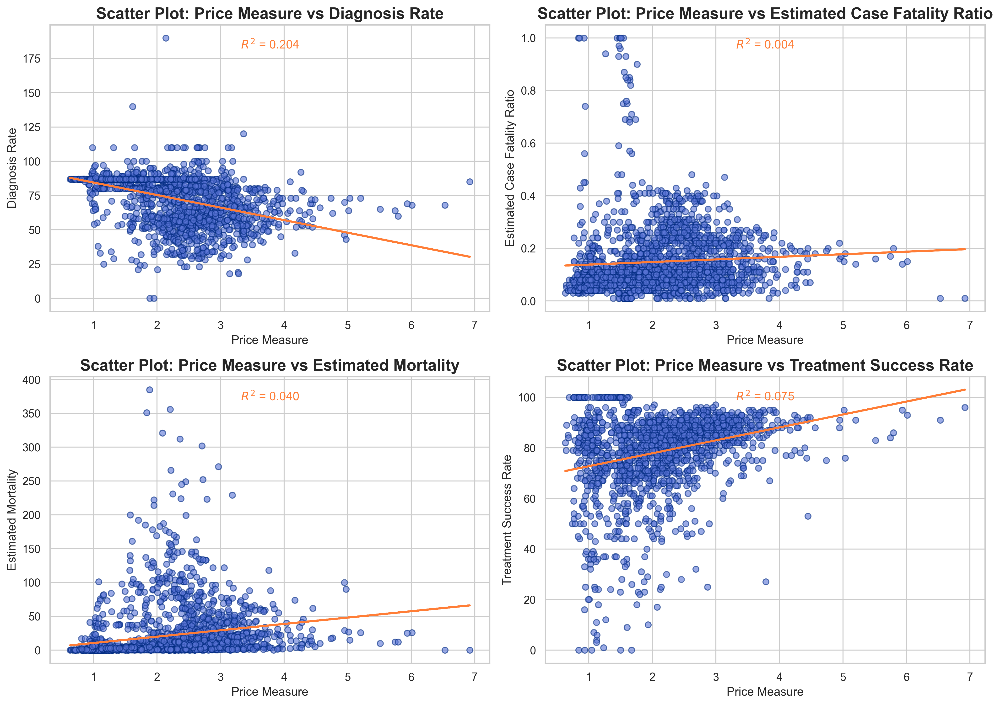

In [ ]:
# create subplots with 2 rows and 2 columns
fig, axes = plt.subplots(2, 2, figsize=(14, 10), dpi=300)
axes = axes.flatten()

# loop through the variables and create scatter plots with regression line
for i, y_var in enumerate(y_vars):
    # remove rows with NaN values for the current variable
    valid_data = price_regs[['Price Measure', y_var]].dropna()

    # Prepare X and y for the regression
    X = valid_data[['Price Measure']].values  # Must be 2D for sklearn
    y = valid_data[y_var].values

    # Fit linear regression using sklearn
    model = LinearRegression().fit(X, y)
    regression_line = model.predict(X)  # Generate the regression line
    r_squared = model.score(X, y)  # R² value

    # Scatter plot with border color
    axes[i].scatter(X, y, color=dot_color, alpha=0.6, edgecolors='#002a80', label='Data Points')

    # Plot the regression line
    axes[i].plot(X, regression_line, color=line_color, linewidth=2, label='Regression Line')

    # Add R² annotation in orange
    axes[i].annotate(f'$R^2$ = {r_squared:.3f}',
                     xy=(0.5, 0.95), xycoords='axes fraction',
                     fontsize=12, color=line_color,
                     ha='center', va='top')

    # Titles and labels
    axes[i].set_title(f'Scatter Plot: Price Measure vs {meanings[i]}',
                      fontsize=16, fontweight='bold')
    axes[i].set_xlabel('Price Measure', fontsize=12)
    axes[i].set_ylabel(meanings[i], fontsize=12)

# Layout adjustment
plt.tight_layout()
plt.show()


Identifying Pakistan in the scatter plots:

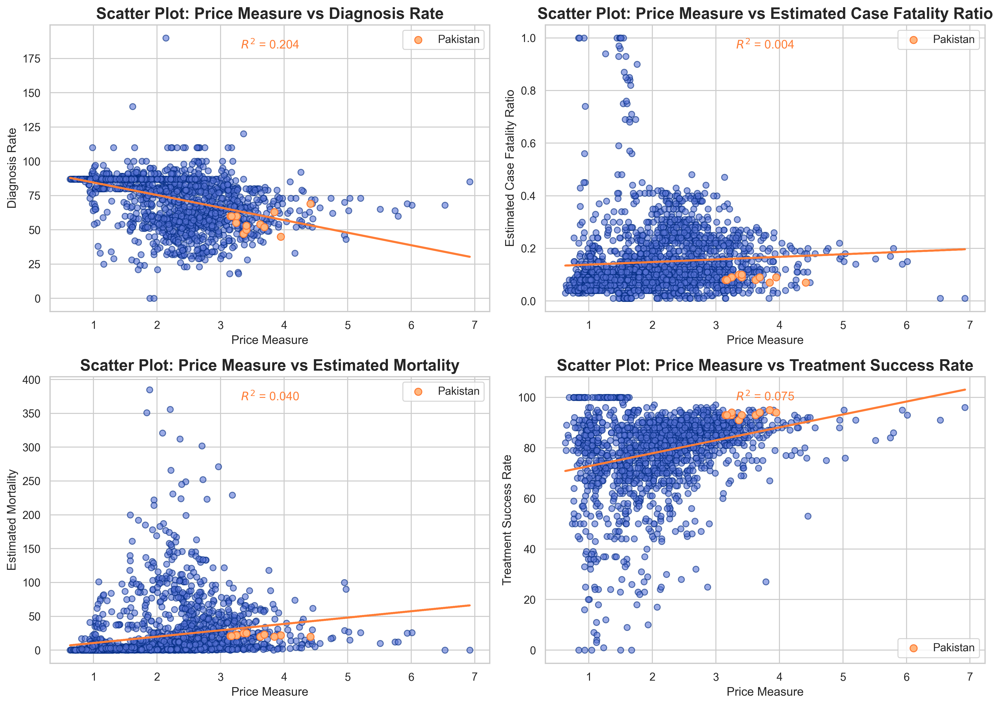

In [119]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10), dpi=300)
axes = axes.flatten()

# loop through the variables and create scatter plots with regression line
for i, y_var in enumerate(y_vars):
    # remove rows with NaN values for the current variable
    valid_data = price_regs[['Price Measure', y_var, 'Country Name']].dropna()

    # Prepare X and y for the regression
    X = valid_data[['Price Measure']].values  # Must be 2D for sklearn
    y = valid_data[y_var].values

    # Fit linear regression using sklearn
    model = LinearRegression().fit(X, y)
    regression_line = model.predict(X)  # Generate the regression line
    r_squared = model.score(X, y)  # R² value

    # Identify rows where Country is Pakistan
    pakistan_indices = valid_data['Country Name'] == 'Pakistan'
    X_pakistan = X[pakistan_indices]
    y_pakistan = y[pakistan_indices]

    # Scatter plot with border color
    axes[i].scatter(X, y, color=dot_color, alpha=0.6, edgecolors='#002a80')

    # Highlight points for Pakistan
    axes[i].scatter(X_pakistan, y_pakistan, color='#ffb67e', edgecolors='#ff7d36', label='Pakistan', s=50)

    # Plot the regression line
    axes[i].plot(X, regression_line, color=line_color, linewidth=2)

    # Add R² annotation in orange
    axes[i].annotate(f'$R^2$ = {r_squared:.3f}',
                     xy=(0.5, 0.95), xycoords='axes fraction',
                     fontsize=12, color=line_color,
                     ha='center', va='top')

    # Titles and labels
    axes[i].set_title(f'Scatter Plot: Price Measure vs {meanings[i]}',
                      fontsize=16, fontweight='bold')
    axes[i].set_xlabel('Price Measure', fontsize=12)
    axes[i].set_ylabel(meanings[i], fontsize=12)

    # Add legend
    axes[i].legend()

# Layout adjustment
plt.tight_layout()
plt.show()


Identifying 2023 data in scatter plots:

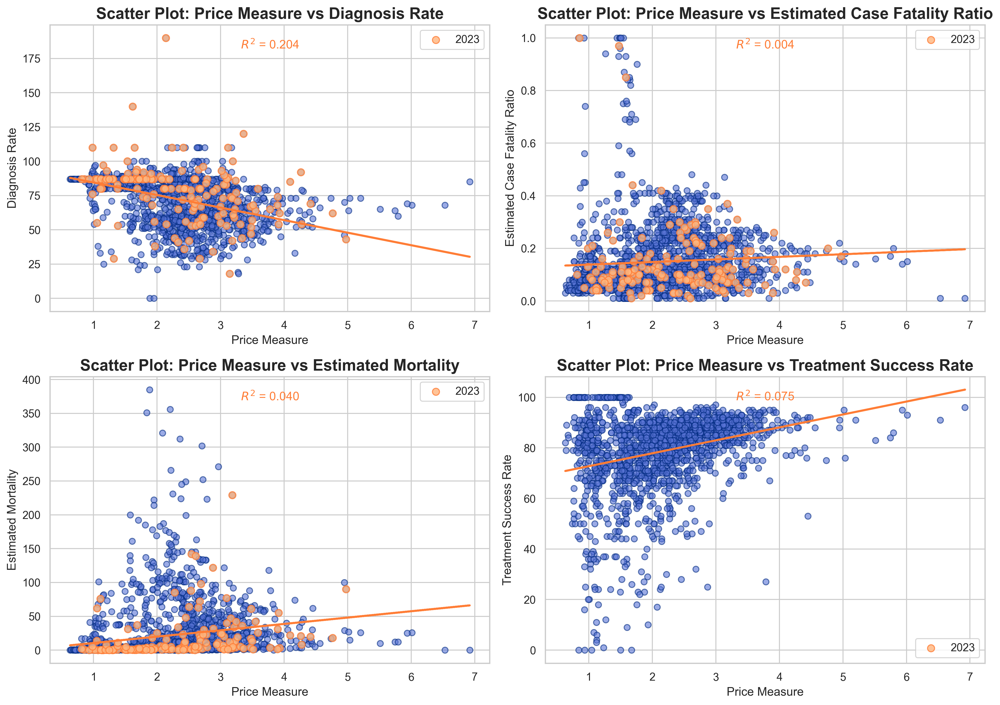

In [230]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10), dpi=300)
axes = axes.flatten()

# loop through the variables and create scatter plots with regression line
for i, y_var in enumerate(y_vars):
    # remove rows with NaN values for the current variable
    valid_data = price_regs[['Price Measure', y_var, 'Country Name', 'Year']].dropna()

    # Prepare X and y for the regression
    X = valid_data[['Price Measure']].values  # Must be 2D for sklearn
    y = valid_data[y_var].values

    # Fit linear regression using sklearn
    model = LinearRegression().fit(X, y)
    regression_line = model.predict(X)  # Generate the regression line
    r_squared = model.score(X, y)  # R² value

    # Identify rows where Country is Pakistan
    pakistan_indices = valid_data['Year'] == 2023
    X_pakistan = X[pakistan_indices]
    y_pakistan = y[pakistan_indices]

    # Scatter plot with border color
    axes[i].scatter(X, y, color=dot_color, alpha=0.6, edgecolors='#002a80')

    # Highlight points for Pakistan
    axes[i].scatter(X_pakistan, y_pakistan, color='#ffb67e', edgecolors='#ff7d36', label='2023', s=50, alpha=0.8)

    # Plot the regression line
    axes[i].plot(X, regression_line, color=line_color, linewidth=2)

    # Add R² annotation in orange
    axes[i].annotate(f'$R^2$ = {r_squared:.3f}',
                     xy=(0.5, 0.95), xycoords='axes fraction',
                     fontsize=12, color=line_color,
                     ha='center', va='top')

    # Titles and labels
    axes[i].set_title(f'Scatter Plot: Price Measure vs {meanings[i]}',
                      fontsize=16, fontweight='bold')
    axes[i].set_xlabel('Price Measure', fontsize=12)
    axes[i].set_ylabel(meanings[i], fontsize=12)

    # Add legend
    axes[i].legend()

# Layout adjustment
plt.tight_layout()
plt.show()


Analyse Regressions:

In [ ]:
regression_results = {}

# loop through each dependent variable and run regression
for y_var in y_vars:
    y = price_regs[y_var]
    
    # drop rows with NaN values
    valid_data = price_regs[['Price Measure', y_var]].dropna()
    
    # define X and add constant for the intercept
    X = sm.add_constant(valid_data['Price Measure'])
    y = valid_data[y_var]
    
    # run OLS regression
    model = sm.OLS(y, X)
    results = model.fit() 
    
    regression_results[y_var] = results.summary()

for y_var, result in regression_results.items():
    print(f"Regression results for {y_var}:\n")
    print(result)
    print("\n" + "="*80 + "\n")

Regression results for c_cdr:

                            OLS Regression Results                            
Dep. Variable:                  c_cdr   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.204
Method:                 Least Squares   F-statistic:                     510.2
Date:                Tue, 17 Dec 2024   Prob (F-statistic):          9.32e-101
Time:                        19:03:03   Log-Likelihood:                -8250.4
No. Observations:                1991   AIC:                         1.650e+04
Df Residuals:                    1989   BIC:                         1.652e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
const          

Trying Robust OLS:
- The HuberT norm is commonly used in robust regression because it balances between the efficiency of ordinary least squares (OLS) and robustness against outliers. It applies a quadratic loss function for smaller residuals (like OLS) but switches to a linear loss function for larger residuals, reducing the influence of outliers.
- However, RLM (Robust Linear Model) in statsmodels does not directly provide standard OLS-style statistics like $R^2$, F-statistic, or p-values, because robust methods often do not rely on the same assumptions (e.g., homoscedasticity, normality of residuals).

In [ ]:
robust_regression_results = {}

# loop through each dependent variable and run robust regression
for y_var in y_vars:
    # drop rows with NaN values
    valid_data = price_regs[['Price Measure', y_var]].dropna()
    
    # define X and add constant for the intercept
    X = sm.add_constant(valid_data['Price Measure'])
    y = valid_data[y_var]
    
    # run RLM regression
    model = sm.RLM(y, X, M=sm.robust.norms.HuberT())
    results = model.fit()
    
    # evaluation metrics
    residuals = y - results.predict(X)
    rss = np.sum(residuals**2)
    tss = np.sum((y - np.mean(y))**2)
    pseudo_r_squared = 1 - (rss / tss)
    # median absolute deviation
    mad = np.median(np.abs(residuals))
    # mean absolute error
    mae = np.mean(np.abs(residuals))
    
    # store results and metrics
    robust_regression_results[y_var] = {
        'Summary': results.summary(),
        'Pseudo R²': pseudo_r_squared,
        'Median Absolute Deviation (MAD)': mad,
        'Mean Absolute Error (MAE)': mae}

# print robust regression results and metrics
for y_var, result in robust_regression_results.items():
    print(f"Robust Regression Results for {y_var}:\n")
    print(result['Summary'])
    print(f"\nEvaluation Metrics:")
    print(f"Pseudo-R²: {result['Pseudo R²']:.3f}")
    print(f"Median Absolute Deviation (MAD): {result['Median Absolute Deviation (MAD)']:.3f}")
    print(f"Mean Absolute Error (MAE): {result['Mean Absolute Error (MAE)']:.3f}")
    print("\n" + "="*80 + "\n")

Robust Regression Results for c_cdr:

                    Robust linear Model Regression Results                    
Dep. Variable:                  c_cdr   No. Observations:                 1991
Model:                            RLM   Df Residuals:                     1989
Method:                          IRLS   Df Model:                            1
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Tue, 24 Dec 2024                                         
Time:                        12:16:22                                         
No. Iterations:                    29                                         
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const   

Correlation Table:
- Including controls for GDP, quality of life, development, etc.

In [155]:
# import data on controls
controls = pd.read_csv('/Users/henriquerodrigues/Desktop/LSE/Y2/Capstone/Data/Input/WB/WB_controls.csv')

# clean - same process for all WB datasets 
controls = controls.drop(columns=['Series Code', 'Country Code'])

    # renaming year columns
controls.columns = [col[:4] if col[:4].isdigit() else col for col in controls.columns]

    # remonving non-country rows
last_index = controls[controls['Country Name'] == 'Zimbabwe'].index[-1]
controls = controls.iloc[:last_index+1]

    # melting year variable from column to row
controls = controls.melt(id_vars=['Country Name', 'Series Name'], 
                               var_name='Year', value_name='Measure')

    # pivoting series variables from rows to columns
controls = controls.pivot(index=["Country Name", "Year"], 
                      columns="Series Name", 
                      values="Measure")

controls.reset_index(inplace=True)

# replace '..' with NA
controls.replace('..', np.nan, inplace=True)

In [156]:
controls

Series Name,Country Name,Year,Current health expenditure (% of GDP),GDP per capita (constant 2015 US$),Government Effectiveness: Estimate,"Government expenditure on education, total (% of GDP)",Human capital index (HCI) (scale 0-1),"Incidence of HIV, all (per 1,000 uninfected population)","Incidence of tuberculosis (per 100,000 people)","Life expectancy at birth, total (years)",Military expenditure (% of GDP),Multidimensional poverty headcount ratio (World Bank) (% of population),Political Stability and Absence of Violence/Terrorism: Estimate,Rule of Law: Estimate
0,Afghanistan,2012,7.89716864,568.929021458341,-1.37553513050079,2.60419988632202,NaN,0.03,189,61.923,1.17541612009987,NaN,-2.41856145858765,-1.6518931388855
1,Afghanistan,2013,8.80596447,580.603833333096,-1.40146291255951,3.45445990562439,NaN,0.03,189,62.417,1.07694976762403,NaN,-2.51934909820557,-1.60975515842438
2,Afghanistan,2014,9.52887821,575.146245808546,-1.36164617538452,3.69521999359131,NaN,0.03,189,62.545,1.29801287790022,NaN,-2.41106843948364,-1.4377019405365
3,Afghanistan,2015,10.10534763,565.569730408751,-1.39739489555359,3.2558000087738,NaN,0.03,189,62.659,0.994575822723645,NaN,-2.56262516975403,-1.51620066165924
4,Afghanistan,2016,11.81859016,563.872336723147,-1.29146802425385,4.54397010803223,NaN,0.03,189,63.136,0.956772140958855,NaN,-2.6621561050415,-1.52253365516663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,Zimbabwe,2019,3.23280239,1350.30985088104,-1.3104350566864,NaN,NaN,1.61,199,61.292,0.729567173018744,42.4,-0.943302512168884,-1.3110408782959
2600,Zimbabwe,2020,2.95440149,1224.27231433409,-1.34236812591553,NaN,0.46689310669899,1.39,188,61.124,0.26176127285265,NaN,-1.05274343490601,-1.33736205101013
2601,Zimbabwe,2021,2.78975058,1305.22011277711,-1.29056119918823,NaN,NaN,1.24,199,59.253,0.815977410678401,NaN,-0.954442739486694,-1.28212225437164
2602,Zimbabwe,2022,NaN,1361.91453034818,-1.25122380256653,NaN,NaN,1.12,209,59.391,0.42705656262948,NaN,-0.894974112510681,-1.23702752590179


In [157]:
control_col_map = {
    'Country Name': 'Country Name',
    'Country Code': 'Country Code',
    'Year': 'Year',
    'Current health expenditure (% of GDP)': 'health_expend_%gdp',
    'GDP per capita (constant 2015 US$)': 'gdp_capita',
    'Government Effectiveness: Estimate': 'gov_effectiveness',
    'Government expenditure on education, total (% of GDP)': 'education_expend_%gdp',
    'Human capital index (HCI) (scale 0-1)': 'human_cap_index',
    'Incidence of HIV, all (per 1,000 uninfected population)': 'hiv_incidence',
    'Incidence of tuberculosis (per 100,000 people)': 'tb_incidence',
    'Life expectancy at birth, total (years)': 'life_expect',
    'Military expenditure (% of GDP)': 'military_expend_%gdp',
    'Multidimensional poverty headcount ratio (World Bank) (% of population)': 'multidim_poverty',
    'Political Stability and Absence of Violence/Terrorism: Estimate': 'political_stability',
    'Rule of Law: Estimate': 'rule_law'}

controls = controls.rename(columns=control_col_map)

In [158]:
# merge with reg dataset
controls['Year'] = pd.to_numeric(controls['Year'], errors='coerce', downcast='integer')
price_regs_control = pd.merge(price_regs, controls, on=['Country Name', 'Year'], how='left')

In [159]:
price_regs_control

,Country Name,Year,Price Measure,c_cdr,cfr,e_mort_100k,c_new_tsr,health_expend_%gdp,gdp_capita,gov_effectiveness,education_expend_%gdp,human_cap_index,hiv_incidence,tb_incidence,life_expect,military_expend_%gdp,multidim_poverty,political_stability,rule_law
0,Afghanistan,2012,3.052467,50.0,0.25,45.0,88.0,7.89716864,568.929021458341,-1.37553513050079,2.60419988632202,NaN,0.03,189,61.923,1.17541612009987,NaN,-2.41856145858765,-1.6518931388855
1,Afghanistan,2013,3.348430,51.0,0.24,44.0,88.0,8.80596447,580.603833333096,-1.40146291255951,3.45445990562439,NaN,0.03,189,62.417,1.07694976762403,NaN,-2.51934909820557,-1.60975515842438
2,Afghanistan,2014,3.558872,51.0,0.24,43.0,87.0,9.52887821,575.146245808546,-1.36164617538452,3.69521999359131,NaN,0.03,189,62.545,1.29801287790022,NaN,-2.41106843948364,-1.4377019405365
3,Afghanistan,2015,4.038540,56.0,0.22,40.0,88.0,10.10534763,565.569730408751,-1.39739489555359,3.2558000087738,NaN,0.03,189,62.659,0.994575822723645,NaN,-2.56262516975403,-1.51620066165924
4,Afghanistan,2016,4.239144,64.0,0.19,34.0,93.0,11.81859016,563.872336723147,-1.29146802425385,4.54397010803223,NaN,0.03,189,63.136,0.956772140958855,NaN,-2.6621561050415,-1.52253365516663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2599,Zimbabwe,2019,1.907018,69.0,0.22,43.0,84.0,3.23280239,1350.30985088104,-1.3104350566864,NaN,NaN,1.61,199,61.292,0.729567173018744,42.4,-0.943302512168884,-1.3110408782959
2600,Zimbabwe,2020,2.028760,54.0,0.24,44.0,88.0,2.95440149,1224.27231433409,-1.34236812591553,NaN,0.46689310669899,1.39,188,61.124,0.26176127285265,NaN,-1.05274343490601,-1.33736205101013
2601,Zimbabwe,2021,1.846908,52.0,0.25,49.0,90.0,2.78975058,1305.22011277711,-1.29056119918823,NaN,NaN,1.24,199,59.253,0.815977410678401,NaN,-0.954442739486694,-1.28212225437164
2602,Zimbabwe,2022,2.183199,54.0,0.26,52.0,89.0,NaN,1361.91453034818,-1.25122380256653,NaN,NaN,1.12,209,59.391,0.42705656262948,NaN,-0.894974112510681,-1.23702752590179


Without controls:

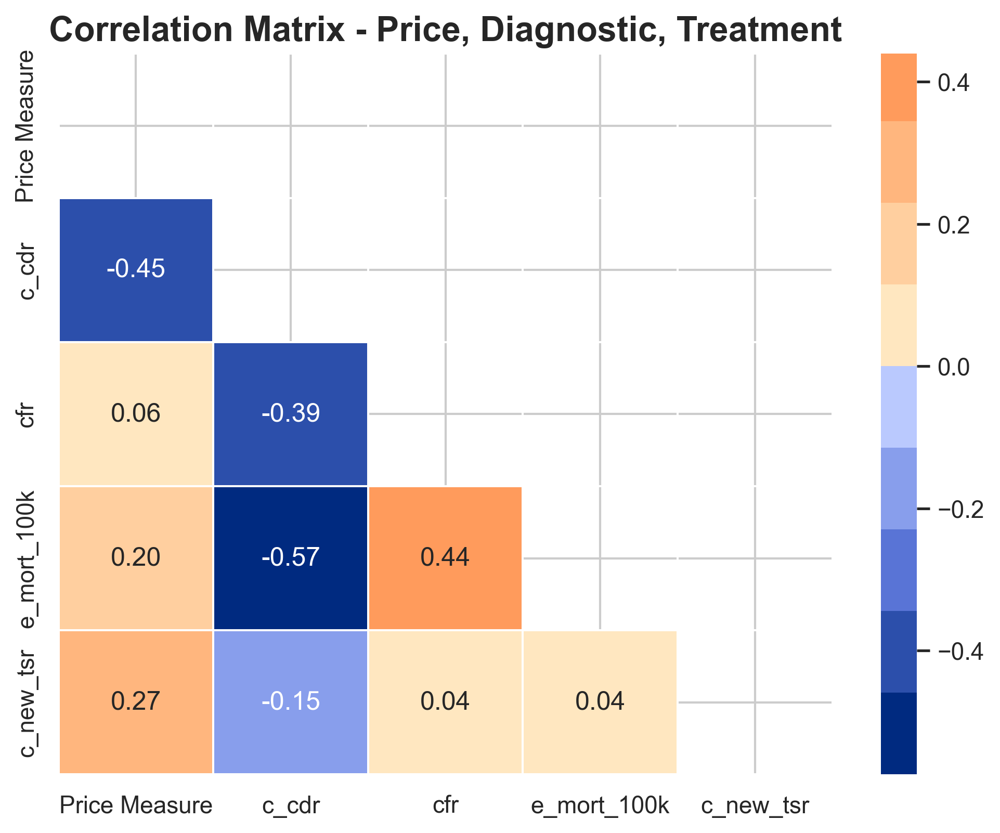

In [174]:
correlation_data = price_regs.drop(columns=['Country Name', 'Year'])

# compute correlation matrix
corr_matrix = correlation_data.corr()
# mask lower triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(8, 6), dpi=300)

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap=sns.color_palette(custom_palette), mask=mask,
            center=0, linewidths=0.5, annot_kws={'size': 12})

plt.title('Correlation Matrix - Price, Diagnostic, Treatment', fontsize=16, fontweight='bold')
plt.show()

With controls:

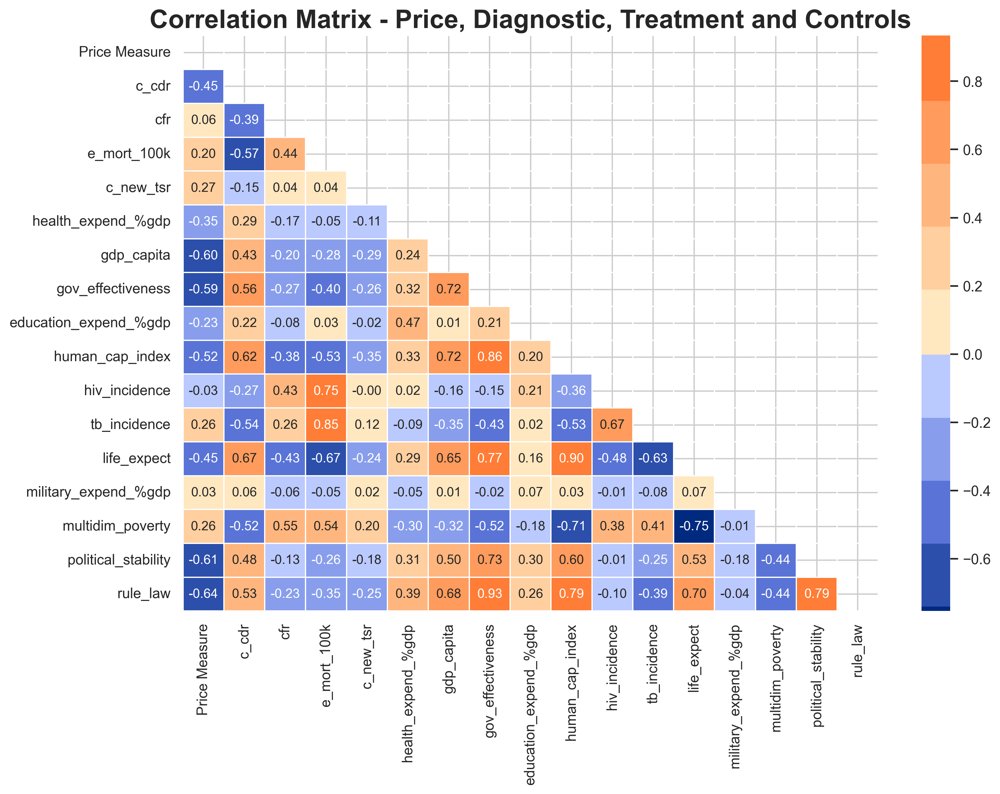

In [167]:
correlation_data = price_regs_control.drop(columns=['Country Name', 'Year'])

# compute correlation matrix
corr_matrix = correlation_data.corr()
# mask lower triangle
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(12, 8), dpi=300)

sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap=sns.color_palette(custom_palette), mask=mask,
            center=0, linewidths=0.5, annot_kws={'size': 10})

plt.title('Correlation Matrix - Price, Diagnostic, Treatment and Controls', fontsize=20, fontweight='bold')
plt.show()